# FT-Transformer — Predicción de consumo mensual del Metro de Medellín

Tercer notebook de la comparación: una **red neuronal tipo FT-Transformer** (transformer tabular con atención
sobre las *features*), manteniendo el mismo escenario, splits, CV walk-forward, métricas, manejo de meses
atípicos, intervalos y exportación que los notebooks de árboles y de Random Forest.

**Diferencias propias de una red (acordadas):**
1. **Features adaptadas al README:** las calendáricas discretas (`dia_semana`, `mes`, flags) entran como
   **categóricas con embeddings** (la forma nativa del FT-Transformer, que captura lo que el RF aprovecha sin
   el problema de magnitud de las ordinales crudas); las numéricas (`año`, `semana_año`, lags, rolling) van
   **escaladas**. Se mantiene la máscara de lags inválidos.
2. **Escalado obligatorio** de features y target.
3. **Búsqueda Optuna moderada** sobre los **mismos meses de CV** que los otros notebooks, con early stopping.
4. La importancia de features es por **permutación** (una red no tiene MDI) y las bandas de predicción usan
   **MC Dropout** + residuos de CV (no hay "dispersión entre árboles").

> **GPU recomendada.** En Colab: *Entorno de ejecución → Cambiar tipo de entorno de ejecución → GPU*.
> El código detecta el dispositivo automáticamente; en CPU funciona pero más lento.


## 0. Setup (Colab)

PyTorch ya viene preinstalado en Colab; Optuna no. Esta celda instala Optuna en el kernel actual.

In [1]:
# Colab: instalar Optuna (PyTorch ya viene preinstalado)
%pip install -q optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 425.6/425.6 kB 10.1 MB/s eta 0:00:00


## 1. Imports

In [2]:
import re, warnings, time, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.lines import Line2D
from pandas.tseries.offsets import MonthBegin, MonthEnd
from scipy import stats
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import torch
import torch.nn as nn

# from google.colab import drive
# drive.mount('/content/drive')
# %cd /content/drive/MyDrive/EAFIT/SIMAT/Metro/data/

warnings.filterwarnings('ignore')
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11, 'figure.facecolor': 'white'})

try:
    import optuna
    optuna.logging.set_verbosity(optuna.logging.WARNING)
    HAS_OPTUNA = True
    print(f"\u2713 Optuna {optuna.__version__}")
except ImportError:
    HAS_OPTUNA = False
    print("\u2717 Optuna no instalado \u2014 se usar\u00e1 b\u00fasqueda local (fallback). Instalar: pip install optuna")

try:
    from tqdm.auto import tqdm
except ImportError:
    class tqdm:
        def __init__(self, iterable=None, **kw): self._it = iterable if iterable is not None else []
        def __iter__(self): return iter(self._it)

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"\u2713 PyTorch {torch.__version__}  |  dispositivo: {DEVICE.upper()}")
if DEVICE == 'cpu':
    print("  \u26a0 Sin GPU: el entrenamiento ser\u00e1 m\u00e1s lento. En Colab activa GPU para acelerar.")


✓ Optuna 4.9.0
✓ PyTorch 2.11.0+cu128  |  dispositivo: CUDA


## 2. Configuración global

Mismos `TRAIN_START`, `TEST_START`, `N_CV_FOLDS` y `ATYPICAL_MONTHS` que los otros notebooks → **los meses de
train, CV y test son idénticos**, así la comparación es justa.


In [3]:
# \u2500\u2500\u2500 AJUSTA AQU\u00cd \u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500
CSV_PATH    = 'features_mes_completo.csv'

TRAIN_START = '2018-01'
TEST_START  = '2024-09'

N_CV_FOLDS  = 6           # MISMOS meses de CV que los otros notebooks (no se reduce)
N_TRIALS    = 15          # Iteraciones de la b\u00fasqueda Optuna (incluye la config default como warm-start)
SEED        = 42
CI_LEVEL    = 0.90

# Entrenamiento de la red
MAX_EPOCHS  = 200
PATIENCE    = 20          # early stopping
VAL_FRAC    = 0.12        # fracci\u00f3n final del train (ordenada en tiempo) para early stopping

# Meses at\u00edpicos -> EXCLUIDOS de promedios / an\u00e1lisis agregado
ATYPICAL_MONTHS = ['2024-09', '2025-03', '2025-05', '2025-10', '2025-11', '2025-12']
SHOW_ALL_MONTHS_IN_PLOTS = True

# Config base (def) de la red. La b\u00fasqueda parte de aqu\u00ed (warm-start) -> el tuneado nunca empeora.
DEFAULT_FTT = dict(d_token=32, n_blocks=2, n_heads=4, ffn_factor=2,
                   dropout=0.10, lr=1e-3, weight_decay=1e-5, batch_size=128)

# (Opcional) MAPE de tu RF tuneado sobre meses estables, para dibujarlo como referencia. None = no dibujar.
RF_REF_MAPE = None
# \u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500\u2500

rng = np.random.default_rng(SEED)
torch.manual_seed(SEED)

VARIANTS = ['default', 'tuned']
VCOLORS  = {'default': '#90A4AE', 'tuned': '#7B1FA2'}   # gris vs morado (transformer)
FTT_COLOR = '#7B1FA2'

def is_atyp(mes):
    return mes in ATYPICAL_MONTHS

print("Modelo          : FT-Transformer (tabular)")
print(f"Train desde     : {TRAIN_START}")
print(f"Test desde      : {TEST_START}")
print(f"Folds CV        : {N_CV_FOLDS}  (mismos meses que los otros notebooks)")
print(f"Trials b\u00fasqueda : {N_TRIALS}  (warm-start desde DEFAULT_FTT)")
print(f"Meses at\u00edpicos  : {ATYPICAL_MONTHS}")


Modelo          : FT-Transformer (tabular)
Train desde     : 2018-01
Test desde      : 2024-09
Folds CV        : 6  (mismos meses que los otros notebooks)
Trials búsqueda : 15  (warm-start desde DEFAULT_FTT)
Meses atípicos  : ['2024-09', '2025-03', '2025-05', '2025-10', '2025-11', '2025-12']


## 3. Carga del dataset

> **Unidades.** `Consumo` está en **kWh de energía diaria** (suma de las 24 lecturas horarias del día).
> La anotación *"Nivel de Tensión (kV): 57,50 ≤ x < 220,00 (Nivel IV)"* del origen de los datos **no es una unidad**:
> describe el **nivel de tensión** del punto de medida (categoría tarifaria CREG; Nivel IV = sub‑transmisión / alta
> tensión), normal para una carga grande como el Metro. No se aplica ninguna conversión — solo se homogenizan las
> etiquetas de los ejes a **kWh**.


In [4]:
df = pd.read_csv(CSV_PATH, index_col='Fecha', parse_dates=True)
df.index = pd.to_datetime(df.index)
df.sort_index(inplace=True)

# Filtrar desde TRAIN_START (alineación con SARIMAX)
df = df[df.index >= pd.Timestamp(TRAIN_START + '-01')].copy()

print(f"Shape           : {df.shape}")
print(f"Rango de fechas : {df.index.min().date()} \u2192 {df.index.max().date()}")
nulos = df.isnull().sum()
nc = nulos[nulos > 0]
print(f"Columnas con nulos: {len(nc)}" + (f"\n{nc}" if len(nc) else " \u2014 ninguno"))
print(f"\nConsumo \u2014 media: {df['Consumo'].mean():,.0f}  "
      f"std: {df['Consumo'].std():,.0f}  "
      f"min: {df['Consumo'].min():,.0f}  max: {df['Consumo'].max():,.0f}")

Shape           : (2852, 90)
Rango de fechas : 2018-03-12 → 2025-12-31
Columnas con nulos: 0 — ninguno

Consumo — media: 69,212  std: 13,228  min: 19,741  max: 88,671


## 4. Feature sets — FT-Transformer

Según el README, una red debe usar la representación que mejor maneja:

- **Categóricas (embeddings):** `dia_semana`, `mes` y los flags binarios de calendario. Cada valor aprende su
  propio vector — captura la misma información que el RF (que las usa como ordinales) **sin** imponer una falsa
  magnitud (p. ej. que diciembre=12 esté "lejos" de enero=1). Las cíclicas quedan subsumidas, así que no se usan.
- **Numéricas (escaladas):** `año`, `semana_año`, los lags y los rolling. Los lags llevan la **máscara de lags
  inválidos** (no disponibles en producción para días lejanos del mes) y se imputan a la media (= 0 tras escalar).


In [5]:
_pat_lag = re.compile(r'^lag_(\d+)$')

LAG_COLS  = sorted([c for c in df.columns if _pat_lag.match(c)],
                   key=lambda c: int(_pat_lag.match(c).group(1)))
ROLL_COLS = [c for c in df.columns
             if c.startswith(('media_roll_', 'std_roll_', 'mediana_roll_'))]

_CAT_CANDID = ['dia_semana', 'mes', 'es_fin_semana', 'es_festivo', 'dia_antes_festivo',
               'dia_despues_festivo', 'semana_navidad', 'covid_cuarentena', 'es_mantenimiento']
CAT_COLS = [c for c in _CAT_CANDID if c in df.columns]
NUM_COLS = [c for c in ['a\u00f1o', 'semana_a\u00f1o'] if c in df.columns] + LAG_COLS + ROLL_COLS

# Convertir categóricas a códigos enteros 0-indexados (offset = mínimo observado)
for c in CAT_COLS:
    df[c] = df[c].astype(int)
CAT_MIN   = {c: int(df[c].min()) for c in CAT_COLS}
CAT_CARDS = [int(df[c].max()) - CAT_MIN[c] + 1 for c in CAT_COLS]

print(f"Categ\u00f3ricas (embeddings) : {len(CAT_COLS)}  ->  {CAT_COLS}")
print(f"  cardinalidades        : {dict(zip(CAT_COLS, CAT_CARDS))}")
print(f"Num\u00e9ricas (escaladas)    : {len(NUM_COLS)}  (a\u00f1o, semana_a\u00f1o + {len(LAG_COLS)} lags + {len(ROLL_COLS)} rolling)")
print(f"TOTAL features            : {len(CAT_COLS) + len(NUM_COLS)}")


Categóricas (embeddings) : 9  ->  ['dia_semana', 'mes', 'es_fin_semana', 'es_festivo', 'dia_antes_festivo', 'dia_despues_festivo', 'semana_navidad', 'covid_cuarentena', 'es_mantenimiento']
  cardinalidades        : {'dia_semana': 7, 'mes': 12, 'es_fin_semana': 2, 'es_festivo': 2, 'dia_antes_festivo': 2, 'dia_despues_festivo': 2, 'semana_navidad': 2, 'covid_cuarentena': 2, 'es_mantenimiento': 2}
Numéricas (escaladas)    : 76  (año, semana_año + 62 lags + 12 rolling)
TOTAL features            : 85


## 5. Definición dinámica de splits

- **Train**: desde `TRAIN_START` hasta el día anterior a `TEST_START` (ventana expandible en cada mes de test).
- **Test**: desde `TEST_START` hasta el final del dataset (meses con ≥ 20 días).
- **Folds CV (tuning)**: los `N_CV_FOLDS` meses inmediatamente anteriores al test, dentro del train.
- **Meses estables**: los meses de test que **no** están en `ATYPICAL_MONTHS`. Todo el análisis
  agregado (promedios, comparaciones, conclusiones) se hace **solo sobre estos**.


In [6]:
def month_row_count(period):
    start = pd.Timestamp(str(period) + '-01')
    end   = start + MonthEnd(1)
    return len(df[(df.index >= start) & (df.index <= end)])

test_start = pd.Timestamp(TEST_START + '-01')

# ── Meses de test: desde TEST_START hasta fin, con ≥ 20 días ──────────────────
p = test_start.to_period('M')
last_period = df.index.max().to_period('M')
TEST_MONTHS = []
while p <= last_period:
    if month_row_count(p) >= 20:
        TEST_MONTHS.append(str(p))
    p += 1
if not TEST_MONTHS:
    raise ValueError(f"No hay meses completos de test desde {TEST_START}. Ajusta TEST_START.")

# ── Folds CV (N_CV_FOLDS meses antes del test, dentro del train) ──────────────
p = (test_start - MonthBegin(1)).to_period('M')
CV_MONTHS = []
while len(CV_MONTHS) < N_CV_FOLDS:
    if month_row_count(p) >= 20:
        CV_MONTHS.insert(0, str(p))
    p -= 1

# ── Meses estables vs atípicos ────────────────────────────────────────────────
STABLE_MONTHS   = [m for m in TEST_MONTHS if m not in ATYPICAL_MONTHS]
ATYP_IN_TEST    = [m for m in TEST_MONTHS if m in ATYPICAL_MONTHS]
ANALYSIS_MONTHS = STABLE_MONTHS                                   # base de TODO promedio
PLOT_MONTHS     = TEST_MONTHS if SHOW_ALL_MONTHS_IN_PLOTS else STABLE_MONTHS

pre_test = df[df.index < test_start]

print("=" * 64)
print(f"  Dataset completo : {df.index.min().date()} \u2192 {df.index.max().date()}")
print(f"  Train (pre-test) : {pre_test.index.min().date()} \u2192 {pre_test.index.max().date()}  ({len(pre_test)} días)")
print(f"  Folds CV ({N_CV_FOLDS} m.) : {CV_MONTHS[0]} \u2192 {CV_MONTHS[-1]}  (dentro del train)")
print(f"  Test  ({len(TEST_MONTHS)} m.) : {TEST_MONTHS[0]} \u2192 {TEST_MONTHS[-1]}")
print(f"  \u2192 Estables ({len(STABLE_MONTHS)}) : {STABLE_MONTHS}")
print(f"  \u2192 Atípicos ({len(ATYP_IN_TEST)}) : {ATYP_IN_TEST}")
print("=" * 64)

  Dataset completo : 2018-03-12 → 2025-12-31
  Train (pre-test) : 2018-03-12 → 2024-08-31  (2365 días)
  Folds CV (6 m.) : 2024-03 → 2024-08  (dentro del train)
  Test  (16 m.) : 2024-09 → 2025-12
  → Estables (10) : ['2024-10', '2024-11', '2024-12', '2025-01', '2025-02', '2025-04', '2025-06', '2025-07', '2025-08', '2025-09']
  → Atípicos (6) : ['2024-09', '2025-03', '2025-05', '2025-10', '2025-11', '2025-12']


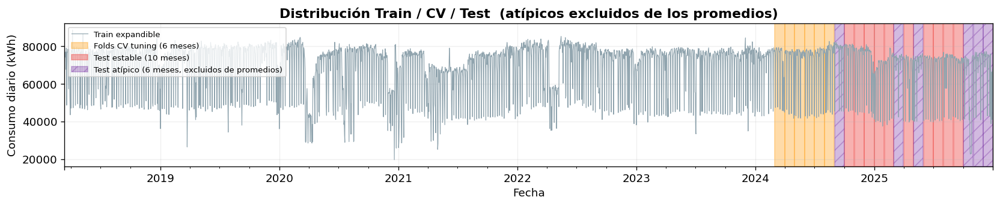

In [7]:
# ── Visualización del split ───────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 3))
df['Consumo'].plot(ax=ax, lw=0.7, color='#90A4AE', label='Train expandible')

for mes in CV_MONTHS:
    s = pd.Timestamp(f'{mes}-01'); e = s + MonthEnd(1)
    ax.axvspan(s, e, color='#FFA726', alpha=0.40)
ax.axvspan(0, 0, color='#FFA726', alpha=0.40, label=f'Folds CV tuning ({N_CV_FOLDS} meses)')

for mes in STABLE_MONTHS:
    s = pd.Timestamp(f'{mes}-01'); e = s + MonthEnd(1)
    ax.axvspan(s, e, color='#EF5350', alpha=0.45)
ax.axvspan(0, 0, color='#EF5350', alpha=0.45, label=f'Test estable ({len(STABLE_MONTHS)} meses)')

for mes in ATYP_IN_TEST:
    s = pd.Timestamp(f'{mes}-01'); e = s + MonthEnd(1)
    ax.axvspan(s, e, color='#6A1B9A', alpha=0.30, hatch='//')
ax.axvspan(0, 0, color='#6A1B9A', alpha=0.30, hatch='//',
           label=f'Test atípico ({len(ATYP_IN_TEST)} meses, excluidos de promedios)')

ax.set_title('Distribución Train / CV / Test  (atípicos excluidos de los promedios)',
             fontweight='bold')
ax.set_ylabel('Consumo diario (kWh)'); ax.legend(loc='upper left', fontsize=8); ax.grid(True, alpha=0.2)
plt.tight_layout()
plt.savefig('split_overview_arboles.png', dpi=150, bbox_inches='tight')
plt.show()

## 6. Funciones auxiliares, preprocesamiento y modelo FT-Transformer

- `mask_invalid_lags`, `compute_metrics`: idénticas al resto de la familia.
- Preprocesamiento: imputación + `StandardScaler` en numéricas, códigos enteros en categóricas, target estandarizado
  (ajustado **solo con train** en cada fold).
- `FTTransformer`: tokenizador de features (numéricas linealizadas + embeddings de categóricas) + token **[CLS]**
  + bloques transformer (atención multi-cabeza + FFN) + cabeza de regresión sobre el [CLS].
- `train_ftt`: AdamW + MSE sobre el target estandarizado, con **early stopping** en una validación temporal interna.
- `cv_score_ftt`: walk-forward CV mensual sobre `CV_MONTHS`; retorna media/std/mediana del MAPE entre folds.


In [8]:
def mask_invalid_lags(X_test: pd.DataFrame) -> pd.DataFrame:
    """Anula lag_k donde k < día del mes (no disponibles en producción)."""
    X_m = X_test.copy()
    lag_info = {c: int(_pat_lag.match(c).group(1))
                for c in X_test.columns if _pat_lag.match(c)}
    for date in X_m.index:
        N = date.day
        for col, k in lag_info.items():
            if k < N:
                X_m.loc[date, col] = np.nan
    return X_m


def compute_metrics(y_true, y_pred):
    """Calcula MAE, RMSE, MAPE y R² (idéntico al notebook SARIMAX)."""
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae  = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mask = y_true != 0
    mape = np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100
    r2   = r2_score(y_true, y_pred)
    return {'MAE': round(mae, 2), 'RMSE': round(rmse, 2),
            'MAPE (%)': round(mape, 4), 'R²': round(r2, 4)}


# ───────────────── Preprocesamiento ─────────────────
def mask_test_lags(part):
    """Aplica la máscara de lags inválidos a un frame de test/val (solo toca columnas lag_)."""
    p = part.copy()
    p[LAG_COLS] = mask_invalid_lags(p[LAG_COLS])
    return p

def build_preprocessors(train_df):
    imp = SimpleImputer(strategy='mean').fit(train_df[NUM_COLS])
    scaler = StandardScaler().fit(imp.transform(train_df[NUM_COLS]))
    y = train_df['Consumo'].values.astype('float32')
    ymu, ysd = float(y.mean()), float(y.std() + 1e-8)
    return {'imp': imp, 'scaler': scaler, 'ymu': ymu, 'ysd': ysd}

def transform_X(part, pp):
    num = pp['scaler'].transform(pp['imp'].transform(part[NUM_COLS])).astype('float32')
    cat = np.column_stack([part[c].astype(int).values - CAT_MIN[c] for c in CAT_COLS]).astype('int64')
    return num, cat

# ───────────────── Modelo FT-Transformer ─────────────────
class FeatureTokenizer(nn.Module):
    def __init__(self, n_num, cat_cards, d):
        super().__init__()
        self.num_w = nn.Parameter(torch.empty(n_num, d)); self.num_b = nn.Parameter(torch.empty(n_num, d))
        nn.init.normal_(self.num_w, std=0.02); nn.init.zeros_(self.num_b)
        self.cat_emb = nn.ModuleList([nn.Embedding(int(c), d) for c in cat_cards])
        for e in self.cat_emb: nn.init.normal_(e.weight, std=0.02)
        self.cls = nn.Parameter(torch.empty(1, 1, d)); nn.init.normal_(self.cls, std=0.02)
    def forward(self, x_num, x_cat):
        B = x_num.shape[0]
        num_tok = x_num.unsqueeze(-1) * self.num_w.unsqueeze(0) + self.num_b.unsqueeze(0)   # (B,n_num,d)
        cat_tok = torch.stack([emb(x_cat[:, j]) for j, emb in enumerate(self.cat_emb)], dim=1) if self.cat_emb \
                  else x_num.new_zeros(B, 0, self.cls.shape[-1])
        cls = self.cls.expand(B, -1, -1)
        return torch.cat([cls, num_tok, cat_tok], dim=1)

class TransformerBlock(nn.Module):
    def __init__(self, d, n_heads, d_ffn, dropout):
        super().__init__()
        self.ln1 = nn.LayerNorm(d)
        self.attn = nn.MultiheadAttention(d, n_heads, dropout=dropout, batch_first=True)
        self.ln2 = nn.LayerNorm(d)
        self.ff = nn.Sequential(nn.Linear(d, d_ffn), nn.GELU(), nn.Dropout(dropout), nn.Linear(d_ffn, d))
        self.drop = nn.Dropout(dropout)
    def forward(self, x):
        h = self.ln1(x); a, _ = self.attn(h, h, h, need_weights=False); x = x + self.drop(a)
        h = self.ln2(x); x = x + self.ff(h)
        return x

class FTTransformer(nn.Module):
    def __init__(self, n_num, cat_cards, d=32, n_blocks=2, n_heads=4, ffn_factor=2, dropout=0.1):
        super().__init__()
        self.tok = FeatureTokenizer(n_num, cat_cards, d)
        self.blocks = nn.ModuleList([TransformerBlock(d, n_heads, d*ffn_factor, dropout)
                                     for _ in range(n_blocks)])
        self.head = nn.Sequential(nn.LayerNorm(d), nn.ReLU(), nn.Linear(d, 1))
    def forward(self, x_num, x_cat):
        x = self.tok(x_num, x_cat)
        for b in self.blocks:
            x = b(x)
        return self.head(x[:, 0]).squeeze(-1)

def _to_dev(*arrs):
    return [torch.as_tensor(a).to(DEVICE) for a in arrs]

def train_ftt(params, Xnum, Xcat, y_std, seed=SEED):
    """Entrena con early stopping en una validación temporal interna. Devuelve el modelo (mejor estado)."""
    torch.manual_seed(seed); np.random.seed(seed)
    n = len(y_std); n_val = max(1, int(n * VAL_FRAC)); cut = n - n_val
    Xn, Xc = torch.as_tensor(Xnum).to(DEVICE), torch.as_tensor(Xcat).to(DEVICE)
    y = torch.as_tensor(y_std, dtype=torch.float32).to(DEVICE)
    Xn_tr, Xc_tr, y_tr = Xn[:cut], Xc[:cut], y[:cut]
    Xn_va, Xc_va, y_va = Xn[cut:], Xc[cut:], y[cut:]
    model = FTTransformer(len(NUM_COLS), CAT_CARDS, d=params['d_token'], n_blocks=params['n_blocks'],
                          n_heads=params['n_heads'], ffn_factor=params['ffn_factor'],
                          dropout=params['dropout']).to(DEVICE)
    opt = torch.optim.AdamW(model.parameters(), lr=params['lr'], weight_decay=params['weight_decay'])
    lossf = nn.MSELoss(); bs = int(params.get('batch_size', 128))
    ntr = Xn_tr.shape[0]
    best_val, best_state, bad = float('inf'), None, 0
    for ep in range(MAX_EPOCHS):
        model.train()
        perm = torch.randperm(ntr, device=DEVICE)
        for i in range(0, ntr, bs):
            idx = perm[i:i+bs]
            opt.zero_grad()
            loss = lossf(model(Xn_tr[idx], Xc_tr[idx]), y_tr[idx])
            loss.backward(); opt.step()
        model.eval()
        with torch.no_grad():
            vloss = lossf(model(Xn_va, Xc_va), y_va).item()
        if vloss < best_val - 1e-6:
            best_val, bad = vloss, 0
            best_state = {k: v.detach().clone() for k, v in model.state_dict().items()}
        else:
            bad += 1
            if bad >= PATIENCE:
                break
    if best_state is not None:
        model.load_state_dict(best_state)
    return model

def fit_predict_ftt(params, train_df, test_df, return_bundle=False):
    pp = build_preprocessors(train_df)
    Xnum_tr, Xcat_tr = transform_X(train_df, pp)
    y_tr_s = (train_df['Consumo'].values.astype('float32') - pp['ymu']) / pp['ysd']
    model = train_ftt(params, Xnum_tr, Xcat_tr, y_tr_s)
    Xnum_te, Xcat_te = transform_X(test_df, pp)
    model.eval()
    with torch.no_grad():
        Xn, Xc = torch.as_tensor(Xnum_te).to(DEVICE), torch.as_tensor(Xcat_te).to(DEVICE)
        pred_s = model(Xn, Xc).cpu().numpy()
    preds = pred_s * pp['ysd'] + pp['ymu']
    if return_bundle:
        return preds, {'model': model, **pp}
    return preds, None

def cv_score_ftt(params, cv_months):
    """Walk-forward CV mensual. Retorna media/std/mediana del MAPE entre folds."""
    mapes = []
    for mes in cv_months:
        cutoff = pd.Timestamp(f'{mes}-01'); end = cutoff + MonthEnd(1)
        tr  = df[df.index < cutoff]
        val = df[(df.index >= cutoff) & (df.index <= end)]
        if len(tr) < 365 or len(val) == 0:
            continue
        try:
            preds, _ = fit_predict_ftt(params, tr, mask_test_lags(val))
            mapes.append(compute_metrics(val['Consumo'].values, preds)['MAPE (%)'])
        except Exception:
            mapes.append(999.0)
    mapes = np.array(mapes, dtype=float)
    if len(mapes) == 0:
        return {'mean': 999.0, 'std': 0.0, 'median': 999.0, 'folds': []}
    return {'mean': float(np.mean(mapes)),
            'std':  float(np.std(mapes, ddof=1)) if len(mapes) > 1 else 0.0,
            'median': float(np.median(mapes)),
            'folds': mapes.tolist()}

print("\u2713 Modelo y funciones auxiliares definidos.")


✓ Modelo y funciones auxiliares definidos.


## 7. Búsqueda de hiperparámetros (Optuna, warm-started desde la config base)

Optuna (TPE) sobre **los mismos `CV_MONTHS`** que los demás notebooks. El primer trial es exactamente
`DEFAULT_FTT` (`enqueue_trial`), de modo que el **tuneado nunca queda peor que el default**. Cada trial entrena
la red en walk-forward CV con early stopping. Se busca: `d_token`, `n_blocks`, `n_heads`, `ffn_factor`, `dropout`,
`batch_size`, `lr` y `weight_decay`. Criterio: **MAPE medio de CV** (se reportan también std y mediana).

> Cada trial = `N_CV_FOLDS` entrenamientos. Con GPU son minutos; en CPU puede tardar bastante. Baja `N_TRIALS`
> o `MAX_EPOCHS` si lo necesitas (el warm-start hace útiles incluso pocos trials).


In [9]:
CAT_CHOICES = {'d_token': [16, 32, 64], 'n_blocks': [1, 2, 3], 'n_heads': [2, 4, 8],
               'ffn_factor': [1, 2], 'dropout': [0.0, 0.1, 0.2, 0.3], 'batch_size': [64, 128, 256]}

tuning_rows = []
t0 = time.time()

if HAS_OPTUNA:
    def objective(trial):
        params = {k: trial.suggest_categorical(k, v) for k, v in CAT_CHOICES.items()}
        params['lr']           = trial.suggest_float('lr', 1e-4, 3e-3, log=True)
        params['weight_decay'] = trial.suggest_float('weight_decay', 1e-6, 1e-3, log=True)
        cvs = cv_score_ftt(params, CV_MONTHS)
        trial.set_user_attr('cv_std', cvs['std'])
        trial.set_user_attr('cv_median', cvs['median'])
        trial.set_user_attr('params', params)
        return cvs['mean']

    study = optuna.create_study(direction='minimize',
                                sampler=optuna.samplers.TPESampler(seed=SEED))
    study.enqueue_trial(DEFAULT_FTT)                      # trial 1 = config base (warm-start)
    for it in tqdm(range(N_TRIALS), desc='FT-Transformer Optuna'):
        study.optimize(objective, n_trials=1, catch=(Exception,))
        t = study.trials[-1]
        tuning_rows.append({'trial': it+1, 'cv_mape': t.value,
                            'cv_std': t.user_attrs.get('cv_std'),
                            'cv_median': t.user_attrs.get('cv_median'),
                            **t.user_attrs.get('params', {})})
        print(f"  trial {it+1:>3}/{N_TRIALS}  MAPE={t.value:.3f}%  "
              f"mejor={study.best_value:.3f}%  t={(time.time()-t0)/60:.1f}min")
    bt = study.best_trial
    best_params_ftt = bt.user_attrs['params']
    best_stats  = {'mean': bt.value, 'std': bt.user_attrs['cv_std'], 'median': bt.user_attrs['cv_median']}
    k0 = study.trials[0]
    known_stats = {'mean': k0.value, 'std': k0.user_attrs['cv_std'], 'median': k0.user_attrs['cv_median']}

else:
    def _sample_local():
        p = {k: rng.choice(v).item() if hasattr(rng.choice(v), 'item') else rng.choice(v)
             for k, v in CAT_CHOICES.items()}
        p = {k: (int(v) if k in ('d_token','n_blocks','n_heads','ffn_factor','batch_size') else float(v))
             for k, v in p.items()}
        p['lr'] = float(10 ** rng.uniform(-4, np.log10(3e-3)))
        p['weight_decay'] = float(10 ** rng.uniform(-6, -3))
        return p
    cands = [dict(DEFAULT_FTT)] + [_sample_local() for _ in range(N_TRIALS - 1)]
    best_params_ftt, best_stats, known_stats = None, {'mean': np.inf}, None
    for it, params in enumerate(tqdm(cands, desc='FT-Transformer local')):
        cvs = cv_score_ftt(params, CV_MONTHS)
        tuning_rows.append({'trial': it+1, 'cv_mape': cvs['mean'],
                            'cv_std': cvs['std'], 'cv_median': cvs['median'], **params})
        if it == 0:
            known_stats = {'mean': cvs['mean'], 'std': cvs['std'], 'median': cvs['median']}
        if cvs['mean'] < best_stats['mean']:
            best_stats = {'mean': cvs['mean'], 'std': cvs['std'], 'median': cvs['median']}
            best_params_ftt = params
        print(f"  trial {it+1:>3}/{len(cands)}  MAPE={cvs['mean']:.3f}%  mejor={best_stats['mean']:.3f}%  "
              f"t={(time.time()-t0)/60:.1f}min")

tuning_df = pd.DataFrame(tuning_rows)
mejora = known_stats['mean'] - best_stats['mean']
print(f"\n{'='*62}")
print(f"  B\u00fasqueda completada en {(time.time()-t0)/60:.1f} min")
print(f"  Default (base) : MAPE CV = {known_stats['mean']:.3f}%  "
      f"(std {known_stats['std']:.3f} | mediana {known_stats['median']:.3f})")
print(f"  Tuneado        : MAPE CV = {best_stats['mean']:.3f}%  "
      f"(std {best_stats['std']:.3f} | mediana {best_stats['median']:.3f})")
print(f"  Mejora vs base : {mejora:+.3f} pp de MAPE")
print(f"  Params tuneados: {best_params_ftt}")
print(f"{'='*62}")


FT-Transformer Optuna:   0%|          | 0/15 [00:00<?, ?it/s]

  trial   1/15  MAPE=6.310%  mejor=6.310%  t=0.8min
  trial   2/15  MAPE=8.356%  mejor=6.310%  t=0.9min
  trial   3/15  MAPE=4.162%  mejor=4.162%  t=2.1min
  trial   4/15  MAPE=7.731%  mejor=4.162%  t=2.7min
  trial   5/15  MAPE=6.173%  mejor=4.162%  t=3.9min
  trial   6/15  MAPE=9.755%  mejor=4.162%  t=6.0min
  trial   7/15  MAPE=5.694%  mejor=4.162%  t=6.6min
  trial   8/15  MAPE=7.873%  mejor=4.162%  t=7.6min
  trial   9/15  MAPE=5.322%  mejor=4.162%  t=7.9min
  trial  10/15  MAPE=6.122%  mejor=4.162%  t=8.6min
  trial  11/15  MAPE=4.510%  mejor=4.162%  t=9.5min
  trial  12/15  MAPE=5.191%  mejor=4.162%  t=10.5min
  trial  13/15  MAPE=4.690%  mejor=4.162%  t=11.5min
  trial  14/15  MAPE=5.841%  mejor=4.162%  t=12.5min
  trial  15/15  MAPE=5.260%  mejor=4.162%  t=13.8min

  Búsqueda completada en 13.8 min
  Default (base) : MAPE CV = 6.310%  (std 1.569 | mediana 5.710)
  Tuneado        : MAPE CV = 4.162%  (std 1.094 | mediana 3.969)
  Mejora vs base : +2.148 pp de MAPE
  Params tunea

## 8. Convergencia de la búsqueda

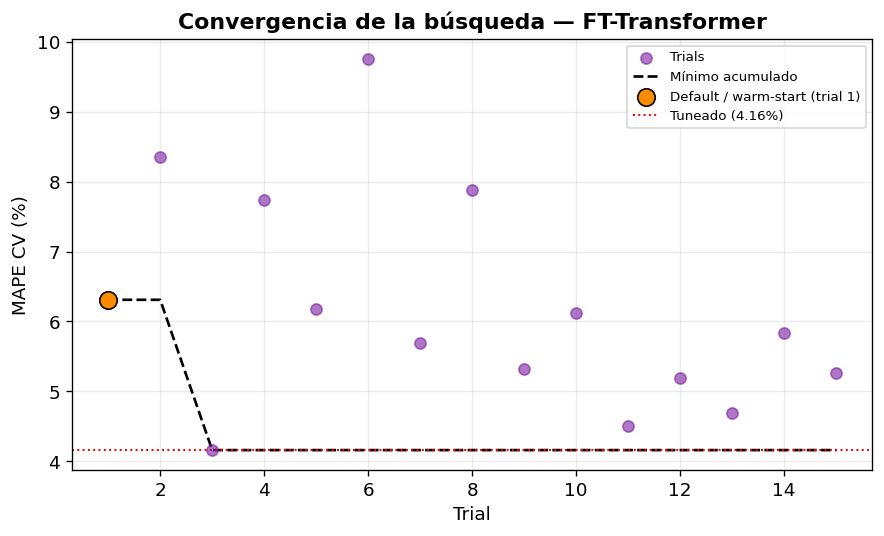

── Hiperparámetros ──
  Default : {'d_token': 32, 'n_blocks': 2, 'n_heads': 4, 'ffn_factor': 2, 'dropout': 0.1, 'lr': 0.001, 'weight_decay': 1e-05, 'batch_size': 128}
  Tuneado : {'d_token': 16, 'n_blocks': 3, 'n_heads': 8, 'ffn_factor': 2, 'dropout': 0.3, 'batch_size': 64, 'lr': 0.0010249322216924156, 'weight_decay': 2.091498132903561e-05}


In [10]:
fig, ax = plt.subplots(figsize=(7.5, 4.6))
ax.scatter(tuning_df['trial'], tuning_df['cv_mape'], color=FTT_COLOR, alpha=0.6, s=45, zorder=3, label='Trials')
ax.plot(tuning_df['trial'], tuning_df['cv_mape'].cummin(), 'k--', lw=1.6, label='M\u00ednimo acumulado')
ax.scatter([1], [tuning_df['cv_mape'].iloc[0]], color='#FB8C00', s=110, zorder=5,
           edgecolor='k', label='Default / warm-start (trial 1)')
ax.axhline(best_stats['mean'], color='red', lw=1.2, ls=':', label=f"Tuneado ({best_stats['mean']:.2f}%)")
if RF_REF_MAPE is not None:
    ax.axhline(RF_REF_MAPE, color='#388E3C', lw=1.3, ls='-.', label=f'RF tuneado ref. ({RF_REF_MAPE:.2f}%)')
ax.set_xlabel('Trial'); ax.set_ylabel('MAPE CV (%)')
ax.set_title('Convergencia de la b\u00fasqueda \u2014 FT-Transformer', fontweight='bold')
ax.legend(fontsize=8); ax.grid(True, alpha=0.25)
plt.tight_layout(); plt.savefig('tuning_convergencia_ftt.png', dpi=150, bbox_inches='tight'); plt.show()

print("\u2500\u2500 Hiperpar\u00e1metros \u2500\u2500")
print(f"  Default : {DEFAULT_FTT}")
print(f"  Tuneado : {best_params_ftt}")


## 9. Evaluación final en test — Default vs Tuneado

Para cada mes se entrena la red con todo el train anterior (ventana expandible), en las dos variantes.
Cada entrenamiento es estocástico pero usa la misma semilla, así es reproducible.


In [11]:
def eval_variants():
    res = {}
    for mes in TEST_MONTHS:
        cutoff = pd.Timestamp(f'{mes}-01'); end = cutoff + MonthEnd(1)
        train = df[df.index < cutoff]
        test  = mask_test_lags(df[(df.index >= cutoff) & (df.index <= end)])
        yte   = test['Consumo'].values
        res[mes] = {}
        for variant, params in [('default', DEFAULT_FTT), ('tuned', best_params_ftt)]:
            preds, bundle = fit_predict_ftt(params, train, test, return_bundle=True)
            res[mes][variant] = {'preds': preds, 'real': yte, 'dates': test.index,
                                 'metrics': compute_metrics(yte, preds), 'bundle': bundle}
        print(f"  \u2713 {mes} evaluado (default + tuned)")
    return res

results = eval_variants()
print("\n\u2713 Evaluaci\u00f3n completa.")


  ✓ 2024-09 evaluado (default + tuned)
  ✓ 2024-10 evaluado (default + tuned)
  ✓ 2024-11 evaluado (default + tuned)
  ✓ 2024-12 evaluado (default + tuned)
  ✓ 2025-01 evaluado (default + tuned)
  ✓ 2025-02 evaluado (default + tuned)
  ✓ 2025-03 evaluado (default + tuned)
  ✓ 2025-04 evaluado (default + tuned)
  ✓ 2025-05 evaluado (default + tuned)
  ✓ 2025-06 evaluado (default + tuned)
  ✓ 2025-07 evaluado (default + tuned)
  ✓ 2025-08 evaluado (default + tuned)
  ✓ 2025-09 evaluado (default + tuned)
  ✓ 2025-10 evaluado (default + tuned)
  ✓ 2025-11 evaluado (default + tuned)
  ✓ 2025-12 evaluado (default + tuned)

✓ Evaluación completa.


## 10. Predicción vs Real — Default vs Tuneado

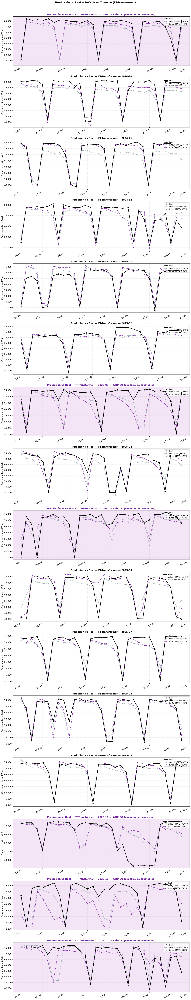

In [12]:
n = len(PLOT_MONTHS)
fig, axes = plt.subplots(n, 1, figsize=(14, 4.5*n), sharex=False)
if n == 1: axes = [axes]
for ax, mes in zip(axes, PLOT_MONTHS):
    dates = results[mes]['tuned']['dates']; real = results[mes]['tuned']['real']
    ax.plot(dates, real, 'k-o', lw=2.2, ms=5, label='Real', zorder=6)
    for variant in VARIANTS:
        p = results[mes][variant]['preds']; mape = results[mes][variant]['metrics']['MAPE (%)']
        ax.plot(dates, p, '--s', ms=4, lw=1.6, color=VCOLORS[variant], alpha=0.9,
                label=f"{variant}  MAPE={mape:.2f}%")
    tag = '  \u26a0 AT\u00cdPICO (excluido de promedios)' if is_atyp(mes) else ''
    ax.set_title(f'Predicci\u00f3n vs Real \u2014 FT-Transformer \u2014 {mes}{tag}',
                 fontsize=12, fontweight='bold', color=('#6A1B9A' if is_atyp(mes) else 'black'))
    ax.set_ylabel('Consumo diario (kWh)'); ax.legend(loc='upper right', fontsize=9)
    ax.grid(True, alpha=0.25, ls='--')
    if is_atyp(mes): ax.set_facecolor('#F3E5F5')
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d-%b'))
    plt.setp(ax.get_xticklabels(), rotation=30, ha='right')
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'))
plt.suptitle('Predicci\u00f3n vs Real \u2014 Default vs Tuneado (FT-Transformer)',
             fontsize=13, fontweight='bold', y=1.005)
plt.tight_layout(); plt.savefig('pred_vs_real_ftt.png', dpi=150, bbox_inches='tight'); plt.show()


## 11. Degradación del error con el horizonte — Default vs Tuneado

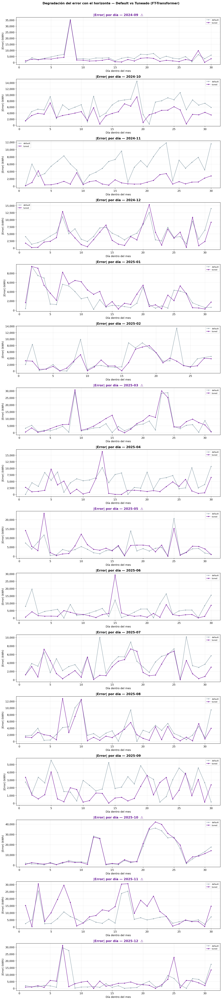

In [13]:
n = len(PLOT_MONTHS)
fig, axes = plt.subplots(n, 1, figsize=(13, 3.6*n), sharex=False)
if n == 1: axes = [axes]
for ax, mes in zip(axes, PLOT_MONTHS):
    dom = np.array([d.day for d in results[mes]['tuned']['dates']])
    for variant in VARIANTS:
        r = results[mes][variant]
        ae = np.abs(np.asarray(r['real'], float) - np.asarray(r['preds'], float))
        ax.plot(dom, ae, '-o', ms=3, lw=1.4, color=VCOLORS[variant], label=variant)
    tag = '  \u26a0' if is_atyp(mes) else ''
    ax.set_title(f'|Error| por d\u00eda \u2014 {mes}{tag}', fontweight='bold',
                 color=('#6A1B9A' if is_atyp(mes) else 'black'))
    ax.set_xlabel('D\u00eda dentro del mes'); ax.set_ylabel('|Error| (kWh)')
    ax.legend(fontsize=8); ax.grid(True, alpha=0.25)
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'))
plt.suptitle('Degradaci\u00f3n del error con el horizonte \u2014 Default vs Tuneado (FT-Transformer)',
             fontsize=13, fontweight='bold', y=1.003)
plt.tight_layout(); plt.savefig('error_horizonte_ftt.png', dpi=150, bbox_inches='tight'); plt.show()


## 12. Tabla comparativa — Default vs Tuneado

In [14]:
def _avg_metrics(variant, meses):
    return pd.DataFrame([results[m][variant]['metrics'] for m in meses]).mean()

rows = []
for mes in TEST_MONTHS:
    for variant in VARIANTS:
        rows.append({'Mes': mes, 'At\u00edpico': is_atyp(mes), 'Variante': variant,
                     **results[mes][variant]['metrics']})
metrics_df = pd.DataFrame(rows)
print("\u2550\u2550 M\u00e9tricas por mes (default vs tuned) \u2550\u2550")
print(metrics_df.to_string(index=False))
print("\n\u2500\u2500 Promedio sobre meses ESTABLES \u2500\u2500")
for variant in VARIANTS:
    a = _avg_metrics(variant, STABLE_MONTHS)
    print(f"  {variant:8s}: MAE={a['MAE']:,.0f}  RMSE={a['RMSE']:,.0f}  "
          f"MAPE={a['MAPE (%)']:.2f}%  R\u00b2={a['R\u00b2']:.4f}")
if RF_REF_MAPE is not None:
    print(f"\n  (referencia) RF tuneado MAPE estable = {RF_REF_MAPE:.2f}%")


══ Métricas por mes (default vs tuned) ══
    Mes  Atípico Variante      MAE     RMSE  MAPE (%)      R²
2024-09     True  default  5023.46  7765.56    6.5817  0.5694
2024-09     True    tuned  3392.35  6954.69    4.4130  0.6547
2024-10    False  default  6357.95  7035.02    8.4931  0.6789
2024-10    False    tuned  3986.62  4441.97    5.2272  0.8720
2024-11    False  default  5728.05  6436.73    7.7677  0.7638
2024-11    False    tuned  1324.10  1699.52    1.9535  0.9835
2024-12    False  default  5282.66  6127.87    7.8623  0.7763
2024-12    False    tuned  4275.72  5744.64    6.3483  0.8034
2025-01    False  default  2553.85  3500.86    4.0944  0.9142
2025-01    False    tuned  3355.61  4251.11    5.6196  0.8734
2025-02    False  default  3801.34  5148.55    6.7217  0.8179
2025-02    False    tuned  2813.36  3548.19    4.3480  0.9135
2025-03     True  default  5906.96  9782.35    8.5853 -0.0116
2025-03     True    tuned  7500.85 10808.64   10.6379 -0.2350
2025-04    False  default  5

## 13. Comparativa visual — MAPE por mes estable (Default vs Tuneado)

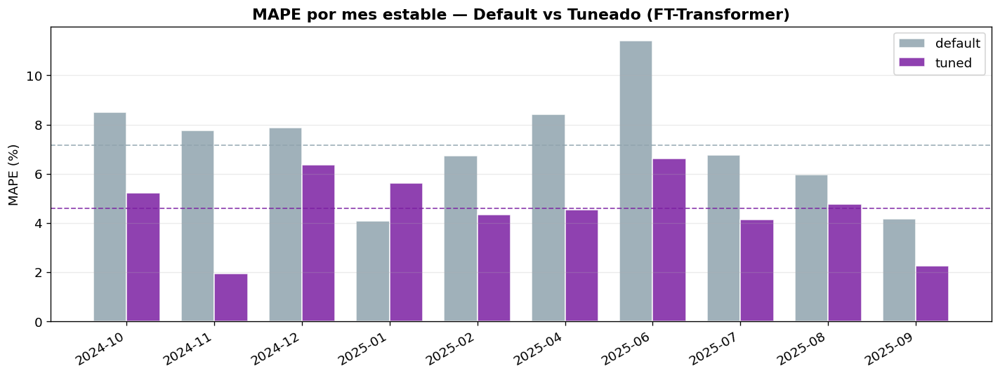

In [15]:
stable = STABLE_MONTHS
x = np.arange(len(stable)); w = 0.38
fig, ax = plt.subplots(figsize=(max(7, len(stable)*1.2), 4.6))
for k, variant in enumerate(VARIANTS):
    vals = [results[m][variant]['metrics']['MAPE (%)'] for m in stable]
    ax.bar(x + (k-0.5)*w, vals, w, color=VCOLORS[variant], alpha=0.85, label=variant, edgecolor='white')
    ax.axhline(float(np.mean(vals)), color=VCOLORS[variant], ls='--', lw=1.1, alpha=0.8)
if RF_REF_MAPE is not None:
    ax.axhline(RF_REF_MAPE, color='#388E3C', ls='-.', lw=1.4, label=f'RF tuneado ({RF_REF_MAPE:.2f}%)')
ax.set_xticks(x); ax.set_xticklabels(stable, rotation=30, ha='right')
ax.set_ylabel('MAPE (%)')
ax.set_title('MAPE por mes estable \u2014 Default vs Tuneado (FT-Transformer)', fontweight='bold')
ax.legend(); ax.grid(True, axis='y', alpha=0.25)
plt.tight_layout(); plt.savefig('comparativa_mape_ftt.png', dpi=150, bbox_inches='tight'); plt.show()


## 14. Heatmap MAPE — mes × variante

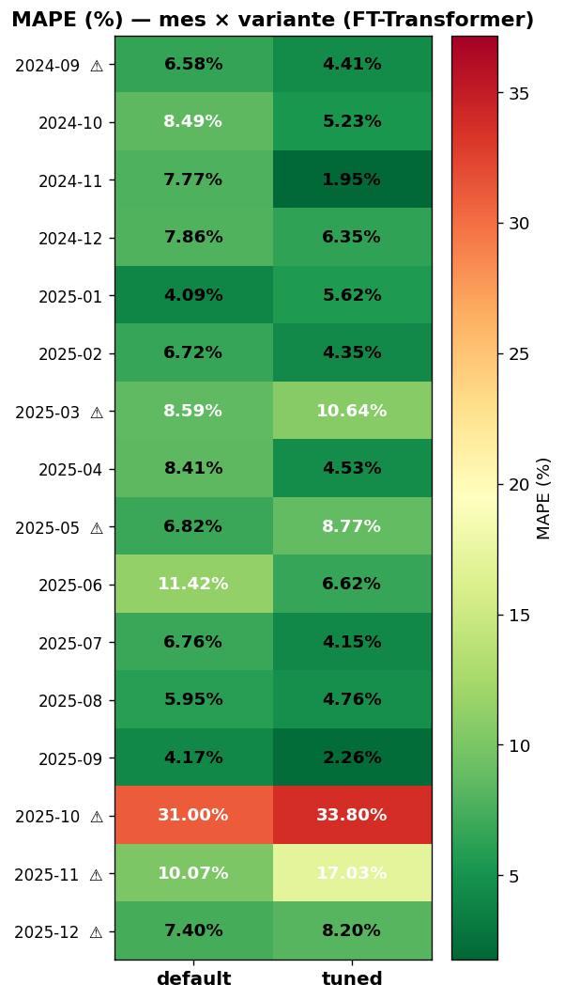

In [16]:
mat = np.array([[results[m][v]['metrics']['MAPE (%)'] for v in VARIANTS] for m in TEST_MONTHS])
fig, ax = plt.subplots(figsize=(5, max(4, len(TEST_MONTHS)*0.5 + 1)))
im = ax.imshow(mat, cmap='RdYlGn_r', aspect='auto', vmin=mat.min()*0.9, vmax=mat.max()*1.1)
ax.set_xticks(range(len(VARIANTS))); ax.set_xticklabels(VARIANTS, fontsize=12, fontweight='bold')
ax.set_yticks(range(len(TEST_MONTHS)))
ax.set_yticklabels([f'{m}  \u26a0' if is_atyp(m) else m for m in TEST_MONTHS], fontsize=10)
mean_val = mat.mean()
for i in range(len(TEST_MONTHS)):
    for j in range(len(VARIANTS)):
        ax.text(j, i, f'{mat[i,j]:.2f}%', ha='center', va='center', fontweight='bold',
                fontsize=11, color='white' if mat[i,j] > mean_val else 'black')
plt.colorbar(im, ax=ax, label='MAPE (%)')
ax.set_title('MAPE (%) \u2014 mes \u00d7 variante (FT-Transformer)', fontweight='bold')
plt.tight_layout(); plt.savefig('heatmap_mape_ftt.png', dpi=150, bbox_inches='tight'); plt.show()


## 15. Importancia de features — por permutación (modelo tuneado)

Una red no tiene "reducción de impureza" como los árboles. Usamos **importancia por permutación**: se entrena un
modelo tuneado con el train completo (hasta `TEST_START`), se mide el MAPE sobre los meses estables agrupados, y
para cada feature se baraja su columna y se mide cuánto **empeora** el MAPE. Mayor aumento = más importante.


Entrenando modelo tuneado para importancia por permutación…
  MAPE base (pool estable) = 4.705%


Permutación:   0%|          | 0/85 [00:00<?, ?it/s]

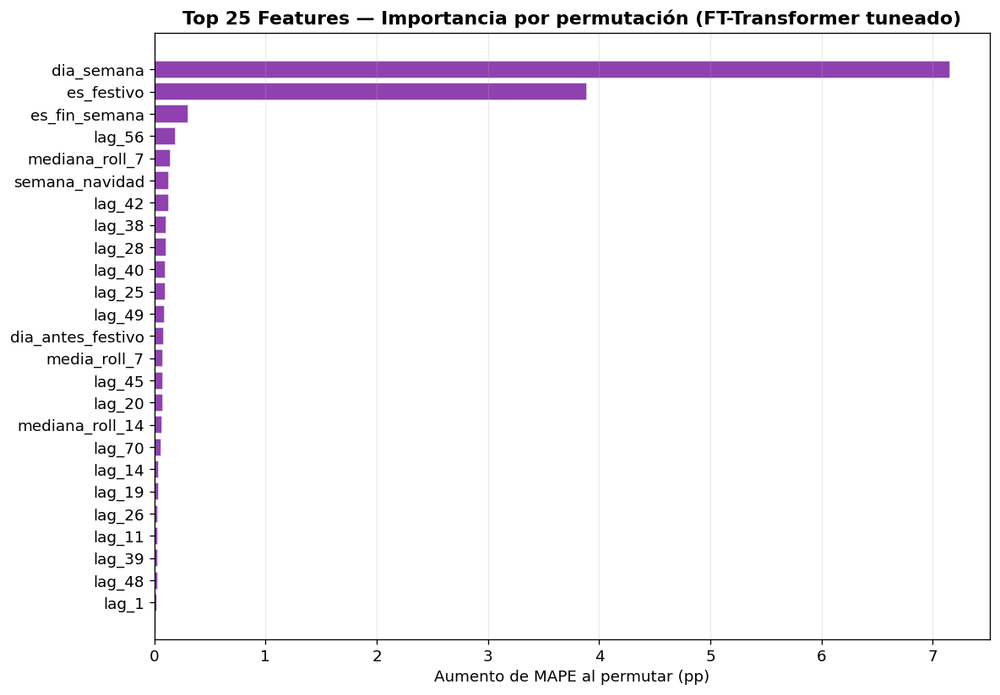

In [17]:
N_PERM_REPEATS = 3
train_all = df[df.index < pd.Timestamp(f'{TEST_START}-01')]
test_pool = pd.concat([mask_test_lags(df[(df.index >= pd.Timestamp(f'{m}-01')) &
                                          (df.index <= pd.Timestamp(f'{m}-01') + MonthEnd(1))])
                       for m in STABLE_MONTHS])
y_pool = test_pool['Consumo'].values

print("Entrenando modelo tuneado para importancia por permutaci\u00f3n\u2026")
_, imp_bundle = fit_predict_ftt(best_params_ftt, train_all, test_pool.iloc[:1], return_bundle=True)

def _predict_bundle(bundle, part):
    Xn, Xc = transform_X(part, bundle); model = bundle['model']; model.eval()
    with torch.no_grad():
        ps = model(torch.as_tensor(Xn).to(DEVICE), torch.as_tensor(Xc).to(DEVICE)).cpu().numpy()
    return ps * bundle['ysd'] + bundle['ymu']

base_mape = compute_metrics(y_pool, _predict_bundle(imp_bundle, test_pool))['MAPE (%)']
print(f"  MAPE base (pool estable) = {base_mape:.3f}%")

imp_rows = []
for col in tqdm(NUM_COLS + CAT_COLS, desc='Permutaci\u00f3n'):
    incs = []
    for _ in range(N_PERM_REPEATS):
        tp = test_pool.copy()
        tp[col] = rng.permutation(tp[col].values)
        incs.append(compute_metrics(y_pool, _predict_bundle(imp_bundle, tp))['MAPE (%)'] - base_mape)
    imp_rows.append({'feature': col, 'mape_increase': float(np.mean(incs))})
perm_imp = pd.DataFrame(imp_rows).sort_values('mape_increase', ascending=False).reset_index(drop=True)

top = perm_imp.head(25).iloc[::-1]
fig, ax = plt.subplots(figsize=(10, 7))
ax.barh(top['feature'], top['mape_increase'], color=FTT_COLOR, alpha=0.85, edgecolor='white')
ax.set_title('Top 25 Features \u2014 Importancia por permutaci\u00f3n (FT-Transformer tuneado)', fontweight='bold')
ax.set_xlabel('Aumento de MAPE al permutar (pp)')
ax.grid(True, axis='x', alpha=0.25)
plt.tight_layout(); plt.savefig('feature_importance_ftt.png', dpi=150, bbox_inches='tight'); plt.show()
perm_imp.to_csv('importancia_permutacion_ftt.csv', index=False)


## 16. APE promedio por horizonte — Default vs Tuneado (meses estables)

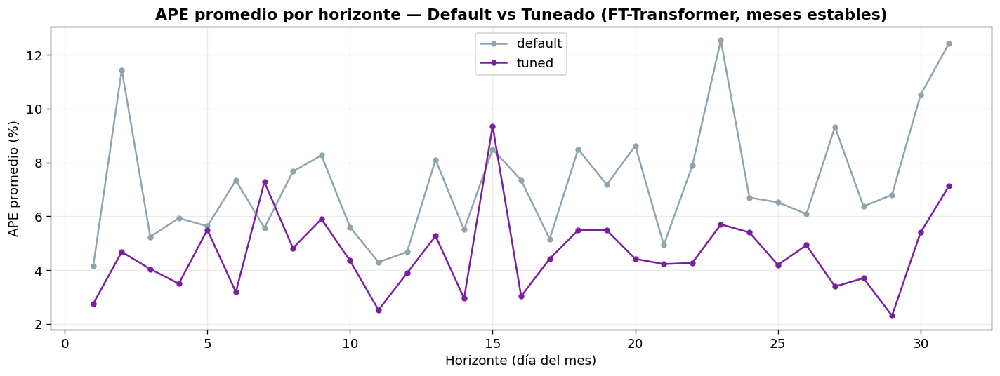

In [18]:
records = []
for mes in STABLE_MONTHS:
    for variant in VARIANTS:
        r = results[mes][variant]
        for d, rl, pr in zip(r['dates'], np.asarray(r['real'], float), np.asarray(r['preds'], float)):
            if rl != 0:
                records.append({'dom': d.day, 'variant': variant, 'ape': abs(rl-pr)/rl*100})
ape_df = pd.DataFrame(records)
fig, ax = plt.subplots(figsize=(12, 4.6))
for variant in VARIANTS:
    g = ape_df[ape_df['variant'] == variant].groupby('dom')['ape'].mean()
    ax.plot(g.index, g.values, '-o', ms=4, lw=1.5, color=VCOLORS[variant], label=variant)
ax.set_xlabel('Horizonte (d\u00eda del mes)'); ax.set_ylabel('APE promedio (%)')
ax.set_title('APE promedio por horizonte \u2014 Default vs Tuneado (FT-Transformer, meses estables)', fontweight='bold')
ax.legend(); ax.grid(True, alpha=0.25)
plt.tight_layout(); plt.savefig('ape_horizonte_ftt.png', dpi=150, bbox_inches='tight'); plt.show()


## 17. Comparación directa por mes — MAPE default vs tuned (con mejora)

In [19]:
rows = []
for mes in TEST_MONTHS:
    md_ = results[mes]['default']['metrics']['MAPE (%)']
    mt_ = results[mes]['tuned']['metrics']['MAPE (%)']
    rows.append({'Mes': mes, 'At\u00edpico': is_atyp(mes), 'MAPE default': round(md_, 2),
                 'MAPE tuned': round(mt_, 2), '\u0394': round(mt_ - md_, 2),
                 '% mejora': round((md_ - mt_)/md_*100, 1) if md_ else None})
cmp_df = pd.DataFrame(rows)
print("\u2550\u2550 MAPE por mes: default vs tuned \u2550\u2550")
print(cmp_df.to_string(index=False))
md_avg = np.mean([results[m]['default']['metrics']['MAPE (%)'] for m in STABLE_MONTHS])
mt_avg = np.mean([results[m]['tuned']['metrics']['MAPE (%)'] for m in STABLE_MONTHS])
print(f"\n(meses estables)  MAPE default = {md_avg:.2f}%   |   tuned = {mt_avg:.2f}%   "
      f"|   mejora = {(md_avg-mt_avg)/md_avg*100:+.1f}%")


══ MAPE por mes: default vs tuned ══
    Mes  Atípico  MAPE default  MAPE tuned     Δ  % mejora
2024-09     True          6.58        4.41 -2.17      33.0
2024-10    False          8.49        5.23 -3.27      38.5
2024-11    False          7.77        1.95 -5.81      74.9
2024-12    False          7.86        6.35 -1.51      19.3
2025-01    False          4.09        5.62  1.53     -37.3
2025-02    False          6.72        4.35 -2.37      35.3
2025-03     True          8.59       10.64  2.05     -23.9
2025-04    False          8.41        4.53 -3.88      46.2
2025-05     True          6.82        8.77  1.96     -28.7
2025-06    False         11.42        6.62 -4.79      42.0
2025-07    False          6.76        4.15 -2.61      38.6
2025-08    False          5.95        4.76 -1.19      19.9
2025-09    False          4.17        2.26 -1.91      45.8
2025-10     True         31.00       33.80  2.80      -9.0
2025-11     True         10.07       17.03  6.96     -69.1
2025-12     True   

## 18. Intervalos — confianza del MAPE mensual y bandas de pronóstico

**A. IC del MAPE mensual** (default y tuneado, con y sin atípicos): igual que en los otros notebooks — IC del MAPE
medio e IP del MAPE de un mes nuevo cualquiera.

**B. Bandas alrededor del pronóstico del modelo tuneado** (adaptadas a una red): **MC Dropout** (se dejan los
dropout activos y se hacen varias pasadas → distribución predictiva) y la banda por **residuos de walk-forward CV**
(estilo conformal, modelo-agnóstica). Con chequeo de cobertura.

> Si el `dropout` tuneado es 0, la banda de MC Dropout colapsa (no hay aleatoriedad); en ese caso la banda por
> residuos de CV es la informativa.


══════════════════════════════════════════════════════════════════════
  INTERVALOS DEL MAPE MENSUAL  (nivel 90%)
══════════════════════════════════════════════════════════════════════
Variante    Escenario  n  MAPE medio  MAPE mediana  std  min   max   IC90% media  IP90% un mes
 default Con atípicos 16        8.88          7.58 6.19 4.09 31.00 [6.17, 11.59] [0.00, 20.06]
 default Sin atípicos 10        7.16          7.26 2.17 4.09 11.42  [5.91, 8.42] [2.99, 11.34]
   tuned Con atípicos 16        8.04          5.42 7.77 1.95 33.80 [4.64, 11.45] [0.00, 22.09]
   tuned Sin atípicos 10        4.58          4.64 1.54 1.95  6.62  [3.69, 5.47]  [1.62, 7.54]


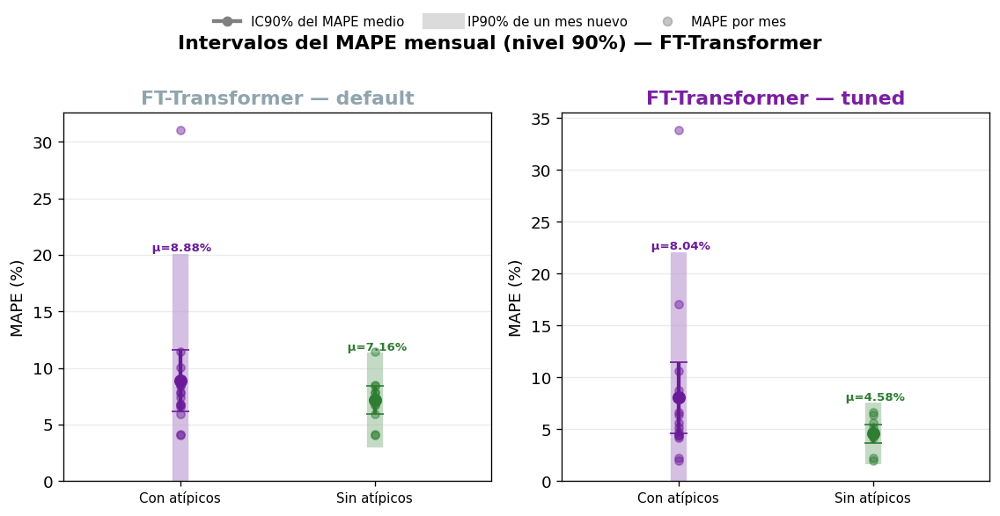

In [20]:
# ── A · IC / IP del MAPE mensual ─────────────────────────────────────────────
Z = CI_LEVEL; pct = int(round(Z * 100))
def _mape_por_mes(variant, meses):
    return np.array([results[m][variant]['metrics']['MAPE (%)'] for m in meses], dtype=float)
def _intervalos_mape(vals, level=Z):
    n = len(vals); mean = float(np.mean(vals)); med = float(np.median(vals))
    sd = float(np.std(vals, ddof=1)) if n > 1 else 0.0
    out = {'n': n, 'media': mean, 'mediana': med, 'std': sd,
           'min': float(np.min(vals)), 'max': float(np.max(vals)),
           'ic_media': (mean, mean), 'ip_mes': (mean, mean)}
    if n > 1:
        t = float(stats.t.ppf(0.5 + level/2, df=n-1)); se = sd/np.sqrt(n)
        out['ic_media'] = (mean - t*se, mean + t*se)
        out['ip_mes']   = (mean - t*sd*np.sqrt(1 + 1/n), mean + t*sd*np.sqrt(1 + 1/n))
    return out
_escenarios = {'Con at\u00edpicos': TEST_MONTHS, 'Sin at\u00edpicos': STABLE_MONTHS}
_store, _rows = {}, []
for variant in VARIANTS:
    _store[variant] = {}
    for esc, meses in _escenarios.items():
        vals = _mape_por_mes(variant, meses); s = _intervalos_mape(vals)
        _store[variant][esc] = {'vals': vals, **s}
        ic = (max(0.0, s['ic_media'][0]), s['ic_media'][1]); ip = (max(0.0, s['ip_mes'][0]), s['ip_mes'][1])
        _rows.append({'Variante': variant, 'Escenario': esc, 'n': s['n'],
                      'MAPE medio': round(s['media'], 2), 'MAPE mediana': round(s['mediana'], 2),
                      'std': round(s['std'], 2), 'min': round(s['min'], 2), 'max': round(s['max'], 2),
                      f'IC{pct}% media': f"[{ic[0]:.2f}, {ic[1]:.2f}]",
                      f'IP{pct}% un mes': f"[{ip[0]:.2f}, {ip[1]:.2f}]"})
ic_mape_df = pd.DataFrame(_rows)
print(f"{'\u2550'*70}\n  INTERVALOS DEL MAPE MENSUAL  (nivel {pct}%)\n{'\u2550'*70}")
print(ic_mape_df.to_string(index=False))
ic_mape_df.to_csv('intervalos_mape_ftt.csv', index=False)

fig, axes = plt.subplots(1, len(VARIANTS), figsize=(4.8*len(VARIANTS), 4.6), sharex=False)
if len(VARIANTS) == 1: axes = [axes]
offsets = {'Con at\u00edpicos': 0.0, 'Sin at\u00edpicos': 1.0}
ec = {'Con at\u00edpicos': '#6A1B9A', 'Sin at\u00edpicos': '#2E7D32'}
for ax, variant in zip(axes, VARIANTS):
    for esc in _escenarios:
        s = _store[variant][esc]; xx = offsets[esc]; m = s['media']
        ic = (max(0.0, s['ic_media'][0]), s['ic_media'][1]); ip = (max(0.0, s['ip_mes'][0]), s['ip_mes'][1])
        ax.scatter(np.full(len(s['vals']), xx), s['vals'], color=ec[esc], alpha=0.45, s=30, zorder=2)
        ax.errorbar(xx, m, yerr=[[m-ip[0]], [ip[1]-m]], fmt='none', ecolor=ec[esc], alpha=0.28, elinewidth=11, zorder=1)
        ax.errorbar(xx, m, yerr=[[m-ic[0]], [ic[1]-m]], fmt='o', color=ec[esc], ecolor=ec[esc],
                    elinewidth=2.6, capsize=6, ms=8, zorder=3)
        ax.text(xx, ip[1], f' \u03bc={m:.2f}%', va='bottom', ha='center', fontsize=8, color=ec[esc], fontweight='bold')
    ax.set_xticks(list(offsets.values())); ax.set_xticklabels(list(offsets.keys()), fontsize=9)
    ax.set_xlim(-0.6, 1.6); ax.set_ylim(bottom=0)
    ax.set_title(f'FT-Transformer \u2014 {variant}', fontweight='bold', color=VCOLORS[variant])
    ax.set_ylabel('MAPE (%)'); ax.grid(True, axis='y', alpha=0.25)
handles = [Line2D([0],[0], color='gray', lw=2.6, marker='o', label=f'IC{pct}% del MAPE medio'),
           Line2D([0],[0], color='gray', lw=11, alpha=0.28, label=f'IP{pct}% de un mes nuevo'),
           Line2D([0],[0], color='gray', lw=0, marker='o', alpha=0.45, label='MAPE por mes')]
fig.legend(handles=handles, loc='upper center', ncol=3, fontsize=9, bbox_to_anchor=(0.5, 1.07), frameon=False)
plt.suptitle(f'Intervalos del MAPE mensual (nivel {pct}%) \u2014 FT-Transformer', fontweight='bold', y=1.005)
plt.tight_layout(); plt.savefig('intervalos_mape_ftt.png', dpi=150, bbox_inches='tight'); plt.show()


Recolectando residuos de walk-forward CV (FT-Transformer tuneado)…
  n=184  q4%=-6.1%  q95%=+8.3%


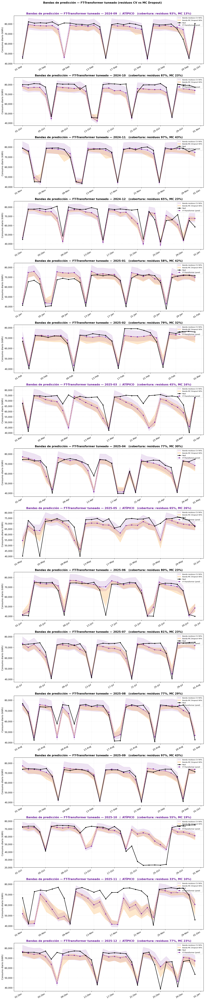


══ Cobertura empírica de la banda por residuos CV (objetivo 90%, meses estables) ══
  FT-Transformer tuneado: cobertura media = 79.6%


In [21]:
# ── B · Bandas alrededor del pronóstico (modelo tuneado) ─────────────────────
PI = CI_LEVEL; q_lo, q_hi = (1 - PI) / 2, 1 - (1 - PI) / 2; T_MC = 50

def collect_cv_rel_residuals_ftt(params, cv_months):
    rel = []
    for mes in cv_months:
        cutoff = pd.Timestamp(f'{mes}-01'); end = cutoff + MonthEnd(1)
        tr = df[df.index < cutoff]; val = df[(df.index >= cutoff) & (df.index <= end)]
        if len(tr) < 365 or len(val) == 0:
            continue
        try:
            preds, _ = fit_predict_ftt(params, tr, mask_test_lags(val))
            preds = np.asarray(preds, float); yv = val['Consumo'].values; ok = preds != 0
            rel.extend(((yv[ok] - preds[ok]) / preds[ok]).tolist())
        except Exception:
            continue
    return np.array(rel, dtype=float)

print("Recolectando residuos de walk-forward CV (FT-Transformer tuneado)\u2026")
cv_rel = collect_cv_rel_residuals_ftt(best_params_ftt, CV_MONTHS)
if len(cv_rel):
    print(f"  n={len(cv_rel)}  q{int(q_lo*100)}%={np.quantile(cv_rel, q_lo)*100:+.1f}%  "
          f"q{int(q_hi*100)}%={np.quantile(cv_rel, q_hi)*100:+.1f}%")

def banda_residuos(mes):
    pred = np.asarray(results[mes]['tuned']['preds'], float)
    if len(cv_rel) == 0:
        return pred.copy(), pred.copy()
    return pred * (1 + np.quantile(cv_rel, q_lo)), pred * (1 + np.quantile(cv_rel, q_hi))

def banda_mc_dropout(mes, T=T_MC):
    b = results[mes]['tuned']['bundle']; model = b['model']
    test = mask_test_lags(df[(df.index >= pd.Timestamp(f'{mes}-01')) &
                             (df.index <= pd.Timestamp(f'{mes}-01') + MonthEnd(1))])
    Xn, Xc = transform_X(test, b)
    Xn, Xc = torch.as_tensor(Xn).to(DEVICE), torch.as_tensor(Xc).to(DEVICE)
    model.train()   # dropout activo
    samps = []
    with torch.no_grad():
        for _ in range(T):
            samps.append(model(Xn, Xc).cpu().numpy() * b['ysd'] + b['ymu'])
    S = np.stack(samps)
    return np.quantile(S, q_lo, axis=0), np.quantile(S, q_hi, axis=0)

n = len(PLOT_MONTHS)
fig, axes = plt.subplots(n, 1, figsize=(14, 4.2*n), sharex=False)
if n == 1: axes = [axes]
for ax, mes in zip(axes, PLOT_MONTHS):
    r = results[mes]['tuned']; dates, real, pred = r['dates'], r['real'], np.asarray(r['preds'], float)
    lo_r, hi_r = banda_residuos(mes); lo_m, hi_m = banda_mc_dropout(mes)
    ax.fill_between(dates, lo_r, hi_r, color='#7B1FA2', alpha=0.12, label=f'Banda residuos CV {int(PI*100)}%')
    ax.fill_between(dates, lo_m, hi_m, color='#FB8C00', alpha=0.20, label=f'Banda MC Dropout {int(PI*100)}%')
    ax.plot(dates, real, 'k-o', lw=2, ms=4, label='Real', zorder=6)
    ax.plot(dates, pred, '--s', ms=3.5, lw=1.5, color='#7B1FA2', label='FT-Transformer (pred)', zorder=5)
    cov_r = float(np.mean((real >= lo_r) & (real <= hi_r))) * 100
    cov_m = float(np.mean((real >= lo_m) & (real <= hi_m))) * 100
    tag = '  \u26a0 AT\u00cdPICO' if is_atyp(mes) else ''
    ax.set_title(f'Bandas de predicci\u00f3n \u2014 FT-Transformer tuneado \u2014 {mes}{tag}   '
                 f'(cobertura: residuos {cov_r:.0f}%, MC {cov_m:.0f}%)',
                 fontweight='bold', color=('#6A1B9A' if is_atyp(mes) else 'black'))
    ax.set_ylabel('Consumo diario (kWh)'); ax.legend(loc='upper right', fontsize=8)
    ax.grid(True, alpha=0.25, ls='--')
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%d-%b'))
    plt.setp(ax.get_xticklabels(), rotation=30, ha='right')
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:,.0f}'))
plt.suptitle('Bandas de predicci\u00f3n \u2014 FT-Transformer tuneado (residuos CV vs MC Dropout)',
             fontweight='bold', y=1.003)
plt.tight_layout(); plt.savefig('bandas_prediccion_ftt.png', dpi=150, bbox_inches='tight'); plt.show()

print(f"\n\u2550\u2550 Cobertura emp\u00edrica de la banda por residuos CV "
      f"(objetivo {int(PI*100)}%, meses estables) \u2550\u2550")
cov = []
for mes in STABLE_MONTHS:
    real = results[mes]['tuned']['real']; lo, hi = banda_residuos(mes)
    cov.append(float(np.mean((real >= lo) & (real <= hi))))
print(f"  FT-Transformer tuneado: cobertura media = {np.mean(cov)*100:.1f}%" if cov else "  (sin meses estables)")


## 19. Resumen sobre meses estables y exportación

In [22]:
summary_rows = []
for variant in VARIANTS:
    a = _avg_metrics(variant, STABLE_MONTHS)
    summary_rows.append({'Variante': variant, 'MAE': round(a['MAE'], 0), 'RMSE': round(a['RMSE'], 0),
                         'MAPE (%)': round(a['MAPE (%)'], 2), 'R\u00b2': round(a['R\u00b2'], 4)})
summary_stable = pd.DataFrame(summary_rows).set_index('Variante')
d_mape = summary_stable.loc['default', 'MAPE (%)']; t_mape = summary_stable.loc['tuned', 'MAPE (%)']
print("\u2550\u2550 RESUMEN \u2014 MESES ESTABLES (FT-Transformer) \u2550\u2550")
print(summary_stable.to_string())
print(f"\n\u2192 MAPE default = {d_mape:.2f}%  \u2192  tuneado = {t_mape:.2f}%  "
      f"(mejora {(d_mape-t_mape)/d_mape*100:+.1f}%)")
if RF_REF_MAPE is not None:
    print(f"  referencia RF tuneado = {RF_REF_MAPE:.2f}%")

all_rows = []
for mes in TEST_MONTHS:
    for variant in VARIANTS:
        r = results[mes][variant]
        for date, pred, real_v in zip(r['dates'], r['preds'], r['real']):
            pred = float(pred)
            all_rows.append({'Fecha': date.date(), 'Mes': mes, 'Atipico': is_atyp(mes), 'Variante': variant,
                             'Real': real_v, 'Prediccion': round(pred, 2),
                             'AbsError': round(abs(real_v - pred), 2),
                             'APE (%)': round(abs(real_v - pred)/real_v*100, 4) if real_v != 0 else None})
preds_df = pd.DataFrame(all_rows)
preds_df.to_csv('predicciones_ftt.csv', index=False)
metrics_df.to_csv('metricas_ftt.csv', index=False)
tuning_df.to_csv('tuning_ftt.csv', index=False)
summary_stable.to_csv('resumen_meses_estables_ftt.csv')
with open('best_params_ftt.json', 'w') as f:
    json.dump({'default': DEFAULT_FTT, 'tuned': best_params_ftt,
               'cv_default': known_stats, 'cv_tuned': best_stats}, f, indent=2, default=str)

print("\nArchivos exportados:")
for fn, desc in [('predicciones_ftt.csv', 'predicciones d\u00eda a d\u00eda (default + tuned)'),
                 ('metricas_ftt.csv', 'MAE/RMSE/MAPE/R\u00b2 por mes y variante'),
                 ('tuning_ftt.csv', 'historial de la b\u00fasqueda'),
                 ('importancia_permutacion_ftt.csv', 'importancia por permutaci\u00f3n'),
                 ('intervalos_mape_ftt.csv', 'intervalos del MAPE mensual'),
                 ('resumen_meses_estables_ftt.csv', 'resumen sobre meses estables'),
                 ('best_params_ftt.json', 'default / tuned + scores CV')]:
    print(f"  {fn:34s} \u2014 {desc}")
print(f"\n{preds_df.head(8).to_string(index=False)}")


══ RESUMEN — MESES ESTABLES (FT-Transformer) ══
             MAE    RMSE  MAPE (%)      R²
Variante                                  
default   4502.0  5430.0      7.16  0.8010
tuned     2898.0  4009.0      4.58  0.8864

→ MAPE default = 7.16%  →  tuneado = 4.58%  (mejora +36.0%)

Archivos exportados:
  predicciones_ftt.csv               — predicciones día a día (default + tuned)
  metricas_ftt.csv                   — MAE/RMSE/MAPE/R² por mes y variante
  tuning_ftt.csv                     — historial de la búsqueda
  importancia_permutacion_ftt.csv    — importancia por permutación
  intervalos_mape_ftt.csv            — intervalos del MAPE mensual
  resumen_meses_estables_ftt.csv     — resumen sobre meses estables
  best_params_ftt.json               — default / tuned + scores CV

     Fecha     Mes  Atipico Variante        Real  Prediccion  AbsError  APE (%)
2024-09-01 2024-09     True  default 45560.17085    45704.34    144.17   0.3164
2024-09-02 2024-09     True  default 82120.50000